 Solving elliptic partial differential equations of form  
 
 $a(x,y)\dfrac{∂^2z}{∂x^2} + b(x,y)\dfrac{∂^2z}{∂x∂y} + c(x,y)\dfrac{∂^2z}{∂y^2} + d(x,y)\dfrac{∂z}{∂x} +e(x,y)\dfrac{∂z}{∂y} + f(x,y)z +g(x,y) = 0$  
 
 $x = αx,\qquad cx1\dfrac{∂z}{∂x} + kx1(y) Z(αx,y) = gx1(y)$  

 $x = βx,\qquad cx2\dfrac{∂z}{∂x} + kx2(y) Z(βx,y) = gx2(y)$  

 $y = αy,\qquad cy1\dfrac{∂z}{∂y} + ky1(x) Z(x,αy) = gy1(x)$  
 
 $y = βy,\qquad cy2\dfrac{∂z}{∂y} + ky2(x) Z(x,βy) = gy2(x)$  

In [1]:
using SparseArrays, SuiteSparse, LinearSolve, LinearSolvePardiso, Plots
#plotlyjs()

In [2]:
function elliptic_pde_solver(I,J,F,C,K,R,G;graph=false)
     
    #unpacking functions and boundary conditions
    a,b,c,d,e,f,g=F
    cx1,cx2,cy1,cy2=C
    kx1,kx2,ky1,ky2=K
    αx,βx,αy,βy=R
    gx1,gx2,gy1,gy2=G;
    
    # declaring the block matrix
    A=zeros(J+1,J+1,I+1,I+1)
    
    # declaring the block vector
    B=zeros(J+1,I+1)

    hx=(βx-αx)/I # x step-size
    hy=(βy-αy)/J # y step-size

    x=[αx+i*hx for i=0:I] # x-nodes
    y=[αy+i*hy for i=0:J] # y-nodes

    for jj=0:J
        j=jj+1
        for ii=0:I
            i=ii+1
            if ii==0 && jj==0 #corner
                A[j,j,i,i:i+2]=[2*hx*kx1(y[j])-3*cx1+2*hy*ky1(x[i])-3*cy1,4*cx1,-cx1]
                A[j,j+1,i,i]=4*cy1
                A[j,j+2,i,i]=-cy1
                B[j,i]=2*(hx*gx1(y[j])+hy*gy1(x[i]))
            elseif ii==I && jj==0 #corner
                A[j,j,i,i-2:i]=[cx2,-4*cx2,2*hx*kx2(y[j])+3*cx2+2*hy*ky1(x[i])-3*cy1]
                A[j,j+1,i,i]=4*cy1
                A[j,j+2,i,i]=-cy1
                B[j,i]=2*(hx*gx2(y[j])+hy*gy1(x[i]))
            elseif ii==0 && jj==J #corner
                A[j,j,i,i:i+2]=[2*hx*kx1(y[j])-3*cx1+2*hy*ky2(x[i])+3*cy2,4*cx1,-cx1]
                A[j,j-1,i,i]=-4*cy2
                A[j,j-2,i,i]=cy2
                B[j,i]=2*(hx*gx1(y[j])+hy*gy2(x[i]))        
            elseif ii==I && jj==J #corner
                A[j,j,i,i-2:i]=[cx2,-4*cx2,2*hx*kx2(y[j])+3*cx2+2*hy*ky2(x[i])+3*cy2]
                A[j,j-1,i,i]=-4*cy2
                A[j,j-2,i,i]=cy2
                B[j,i]=2*(hx*gx2(y[j])+hy*gy2(x[i]))
            elseif jj==0 #line
                A[j,j,i,i]=2*hy*ky1(x[i])-3*cy1
                A[j,j+1,i,i]=4*cy1
                A[j,j+2,i,i]=-cy1
                B[j,i]=2*hy*gy1(x[i])        
            elseif jj==J #line
                A[j,j,i,i]=2*hy*ky2(x[i])+3*cy2
                A[j,j-1,i,i]=-4*cy2
                A[j,j-2,i,i]=cy2
                B[j,i]=2*hy*gy2(x[i])
            elseif ii==0 #line
                A[j,j,i,i]=2*hx*kx1(y[j])-3*cx1
                A[j,j,i,i+1]=4*cx1
                A[j,j,i,i+2]=-cx1
                B[j,i]=2*hx*gx1(y[j])       
            elseif ii==I #line
                A[j,j,i,i]=2*hx*kx2(y[j])+3*cx2
                A[j,j,i,i-1]=-4*cx2
                A[j,j,i,i-2]=cx2
                B[j,i]=2*hx*gx2(y[j])
            else
                A[j,j-1,i,i-1:i+1]=[b(x[i],y[j])/4/hx/hy,
                    (c(x[i],y[j])/hy/hy)-(e(x[i],y[j])/2/hy),
                    -b(x[i],y[j])/4/hx/hy]
                A[j,j,i,i-1:i+1]=[(a(x[i],y[j])/hx/hx)-(d(x[i],y[j])/2/hx),
                    f(x[i],y[j])-(2*a(x[i],y[j])/hx/hx)-(2*c(x[i],y[j])/hy/hy),
                    (a(x[i],y[j])/hx/hx)+(d(x[i],y[j])/2/hx)]
                A[j,j+1,i,i-1:i+1]=[-b(x[i],y[j])/4/hx/hy,
                    (c(x[i],y[j])/hy/hy)+(e(x[i],y[j])/2/hy),
                    b(x[i],y[j])/4/hx/hy]
                B[j,i]=-g(x[i],y[j])
            end
        end
    end
    
    # converting block matrix to a 2D matrix
    II,JJ=I+1,J+1
    N=II*JJ
    AA=sparse(zeros(N,N))
    for i=0:J
        for j=0:J
            AA[i*II+1:(i+1)*II,j*II+1:(j+1)*II]=A[i+1,j+1,:,:]
        end
    end
    
    # Converting block vector to a 1D vector
    bb=zeros(N)
    for i=0:J
        bb[i*II+1:(i+1)*II]=B[i+1,:]
    end
    
    z=AA\bb #solving
    
    ZZ=zeros(J+1,I+1)
    count=0
    for j=1:J+1
        for i=1:I+1
            count+=1
            ZZ[j,i]=z[count]
        end
    end
   
    X=ones(J+1,I+1)
    for i=1:I+1
        X[:,i]=X[:,i]*x[i]
    end
    Y=ones(J+1,I+1)
    for i=1:J+1
        Y[i,:]=Y[i,:]*y[i]
    end
    if graph
        fig=surface(X,Y,ZZ, colormap = :Spectral,size=(900,600))
        display(fig)
    end
    return X,Y,ZZ
end ;

In [3]:
# sample functions
a(x,y)=1
b(x,y)=0#+1
c(x,y)=1
d(x,y)=0#+1
e(x,y)=0#+1
f(x,y)=0#+sin(x+y)
g(x,y)=2*π^2*sin(π*x)*sin(π*y)# - π^2*cos(π*x)*cos(π*y) - π*cos(π*x)*sin(π*y)-π*sin(π*x)*cos(π*y)-sin(x+y)*sin(π*x)*sin(π*y)

F=a,b,c,d,e,f,g;

# sample boundary conditions : Robin, Dirichlet, Dirichlet, Robin
cx1,cx2,cy1,cy2=1,0,0,1
C=cx1,cx2,cy1,cy2
kx1(y),kx2(y),ky1(x),ky2(x)=1,1,1,1
K=kx1,kx2,ky1,ky2
αx,βx,αy,βy=0,1,0,1
R=αx,βx,αy,βy
gx1(y)=π*sin(π*y)
gx2(y),gy1(x),=0,0,0
gy2(x)=-π*sin(π*x)
G=gx1,gx2,gy1,gy2 ;

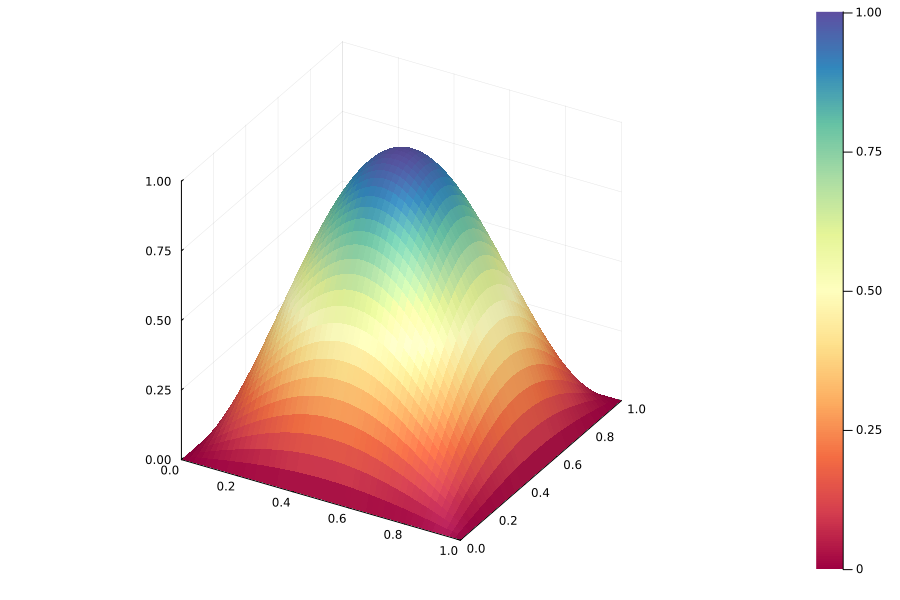

 11.725883 seconds (11.23 M allocations: 1.116 GiB, 3.78% gc time, 80.77% compilation time: 23% of which was recompilation)


In [4]:
# The solution is of the form:
# z(x,y) = sin(π*x)*sin(π*y)
@time X,Y,Z=elliptic_pde_solver(50,50,F,C,K,R,G;graph=true) ;

In [5]:
# sample functions
a(x,y)=1
b(x,y)=0
c(x,y)=1
d(x,y)=0
e(x,y)=0
f(x,y)=0
g(x,y)=2*π^2*sin(π*x)*sin(π*y)

F=a,b,c,d,e,f,g;

# sample boundary conditions
cx1,cx2,cy1,cy2=0,0,0,0
C=cx1,cx2,cy1,cy2

kx1(y)=1
kx2(y)=1
ky1(x)=1
ky2(x)=1
K=kx1,kx2,ky1,ky2

αx,βx,αy,βy=0,0.5,0,0.5
R=αx,βx,αy,βy

gx1(y)=0
gx2(y)=0+sin(π*y)
gy1(x)=0
gy2(x)=0+sin(π*x)
G=gx1,gx2,gy1,gy2 ;

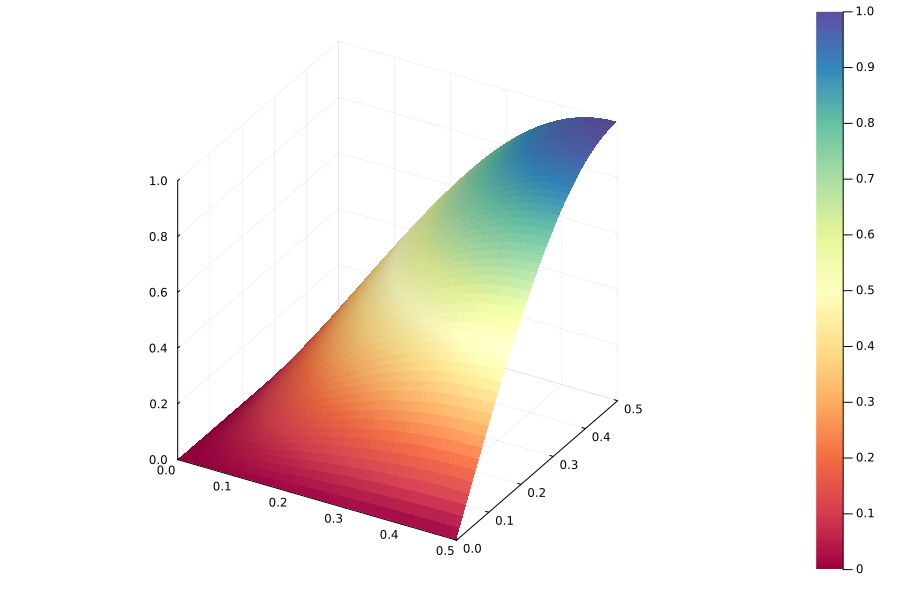

  2.657599 seconds (277.80 k allocations: 473.394 MiB, 2.08% gc time, 21.51% compilation time)


In [6]:
# The solution is of the form:
# z(x,y) = sin(π*x)*sin(π*y)
@time X,Y,Z=elliptic_pde_solver(50,50,F,C,K,R,G;graph=true) ;

In [7]:
# sample functions
a(x,y)=1
b(x,y)=0+1
c(x,y)=2
d(x,y)=0+1
e(x,y)=0+1
f(x,y)=0+sin(x+y)
g(x,y)=3*π^2*sin(π*x)*sin(π*y) - π^2*cos(π*x)*cos(π*y) - π*cos(π*x)*sin(π*y)-π*sin(π*x)*cos(π*y)-sin(x+y)*sin(π*x)*sin(π*y)

F=a,b,c,d,e,f,g;

# sample boundary conditions
cx1,cx2,cy1,cy2=0,0,0,0
C=cx1,cx2,cy1,cy2
kx1(y),kx2(y),ky1(x),ky2(x)=1,1,1,1
K=kx1,kx2,ky1,ky2
αx,βx,αy,βy=0,1,0,1
R=αx,βx,αy,βy
gx1(y),gx2(y),gy1(x),gy2(x)=0,0,0,0 
G=gx1,gx2,gy1,gy2 ;

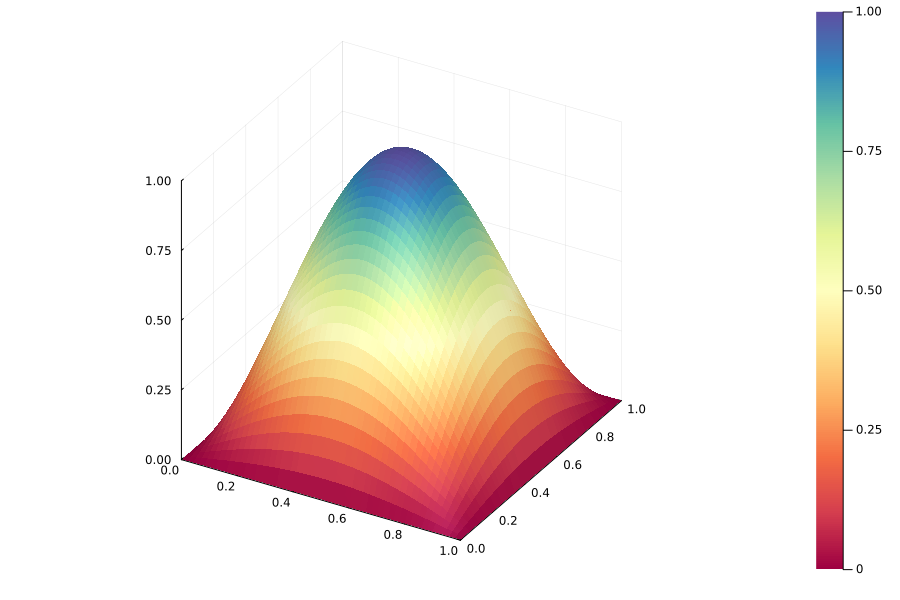

  2.806082 seconds (274.83 k allocations: 665.499 MiB, 1.53% gc time, 20.26% compilation time: 100% of which was recompilation)


In [8]:
# The solution is of the form:
# z(x,y) = sin(π*x)*sin(π*y)
@time X,Y,Z=elliptic_pde_solver(50,50,F,C,K,R,G;graph=true) ;

In [ ]:
# The solution is of the form:
# z(x,y) = sin(π*x)*sin(π*y)
# This will crash the device
@time X,Y,Z=elliptic_pde_solver(200,200,F,C,K,R,G;graph=true) ;

In [9]:
function elliptic_pde_solver_opt(I,J,F,C,K,R,G;graph=false)
    
    #unpacking functions and boundary conditions
    a,b,c,d,e,f,g=F
    cx1,cx2,cy1,cy2=C
    kx1,kx2,ky1,ky2=K
    αx,βx,αy,βy=R
    gx1,gx2,gy1,gy2=G;
    
    II,JJ=I+1,J+1
    N=II*JJ
    
    # declaring the sparse matrix
    RowV=ones(9*N)
    ColV=ones(9*N)
    ValV=zeros(9*N)
    
    # declaring the block vector
    B=zeros(N)

    hx=(βx-αx)/I # x step-size
    hy=(βy-αy)/J # y step-size

    x=[αx+i*hx for i=0:I] # x-nodes
    y=[αy+i*hy for i=0:J] # y-nodes
    
    count=0

    for j=1:JJ
        for i=1:II

            ii=(j-1)*II+i
            if i==1 && j==1 #corner
                RowV[count+1:count+5]=[ii,ii,ii,ii,ii]
                ColV[count+1:count+5]=[ii,ii+1,ii+2,ii+II,ii+2*II]
                ValV[count+1:count+5]=[2*hx*kx1(y[j])-3*cx1+2*hy*ky1(x[i])-3*cy1,4*cx1,-cx1,4*cy1,-cy1]
                B[ii]=2*(hx*gx1(y[j])+hy*gy1(x[i]))
                count+=5
            elseif i==II && j==1 #corner
                RowV[count+1:count+5]=[ii,ii,ii,ii,ii]
                ColV[count+1:count+5]=[ii-2,ii-1,ii,ii+II,ii+2*II]
                ValV[count+1:count+5]=[cx2,-4*cx2,2*hx*kx2(y[j])+3*cx2+2*hy*ky1(x[i])-3*cy1,4*cy1,-cy1]
                B[ii]=2*(hx*gx2(y[j])+hy*gy1(x[i]))
                count+=5
            elseif i==1 && j==JJ #corner
                RowV[count+1:count+5]=[ii,ii,ii,ii,ii]
                ColV[count+1:count+5]=[ii,ii+1,ii+2,ii-II,ii-2*II]
                ValV[count+1:count+5]=[2*hx*kx1(y[j])-3*cx1+2*hy*ky2(x[i])+3*cy2,4*cx1,-cx1,-4*cy2,cy2]
                B[ii]=2*(hx*gx1(y[j])+hy*gy2(x[i])) 
                count+=5
            elseif i==II && j==JJ #corner
                RowV[count+1:count+5]=[ii,ii,ii,ii,ii]
                ColV[count+1:count+5]=[ii-2,ii-1,ii,ii-II,ii-2*II]
                ValV[count+1:count+5]=[cx2,-4*cx2,2*hx*kx2(y[j])+3*cx2+2*hy*ky2(x[i])+3*cy2,-4*cy2,cy2]
                B[ii]=2*(hx*gx2(y[j])+hy*gy2(x[i]))
                count+=5
            elseif j==1 #line
                RowV[count+1:count+3]=[ii,ii,ii]
                ColV[count+1:count+3]=[ii,ii+II,ii+2*II]
                ValV[count+1:count+3]=[2*hy*ky1(x[i])-3*cy1,4*cy1,-cy1]
                B[ii]=2*hy*gy1(x[i])   
                count+=3
            elseif j==JJ #line
                RowV[count+1:count+3]=[ii,ii,ii]
                ColV[count+1:count+3]=[ii,ii-II,ii-2*II]
                ValV[count+1:count+3]=[2*hy*ky2(x[i])+3*cy2,-4*cy2,cy2]
                B[ii]=2*hy*gy2(x[i])
                count+=3
            elseif i==1 #line
                RowV[count+1:count+3]=[ii,ii,ii]
                ColV[count+1:count+3]=[ii,ii+1,ii+2]
                ValV[count+1:count+3]=[2*hx*kx1(y[j])-3*cx1,4*cx1,-cx1]
                B[ii]=2*hx*gx1(y[j])
                count+=3
            elseif i==II #line
                RowV[count+1:count+3]=[ii,ii,ii]
                ColV[count+1:count+3]=[ii,ii-1,ii-2]
                ValV[count+1:count+3]=[2*hx*kx2(y[j])+3*cx2,-4*cx2,cx2]
                B[ii]=2*hx*gx2(y[j])
                count+=3
            else
                RowV[count+1:count+9]=[ii,ii,ii,ii,ii,ii,ii,ii,ii]
                ColV[count+1:count+9]=[ii-II-1,ii-II,ii-II+1,ii-1,ii,ii+1,ii+II-1,ii+II,ii+II+1]
                ValV[count+1:count+9]=[b(x[i],y[j])/4/hx/hy,
                    (c(x[i],y[j])/hy/hy)-(e(x[i],y[j])/2/hy),
                    -b(x[i],y[j])/4/hx/hy,(a(x[i],y[j])/hx/hx)-(d(x[i],y[j])/2/hx),
                    f(x[i],y[j])-(2*a(x[i],y[j])/hx/hx)-(2*c(x[i],y[j])/hy/hy),
                    (a(x[i],y[j])/hx/hx)+(d(x[i],y[j])/2/hx),-b(x[i],y[j])/4/hx/hy,
                    (c(x[i],y[j])/hy/hy)+(e(x[i],y[j])/2/hy),
                    b(x[i],y[j])/4/hx/hy]
                B[ii]=-g(x[i],y[j])
                count+=9
            end
        end
    end
    
    A=sparse(RowV,ColV,ValV)
    prob = LinearProblem(A, B)
    z=solve(prob, MKLPardisoIterate()).u

    ZZ=zeros(J+1,I+1)
    count=0
    for j=1:J+1
        for i=1:I+1
            count+=1
            ZZ[j,i]=z[count]
        end
    end
   
    X=ones(J+1,I+1)
    for i=1:I+1
        X[:,i]=X[:,i]*x[i]
    end
    Y=ones(J+1,I+1)
    for i=1:J+1
        Y[i,:]=Y[i,:]*y[i]
    end
    if graph
        fig=surface(X,Y,ZZ, colormap = :tempo,size=(900,600))
        display(fig)
    end
    return x,y,ZZ
end ;

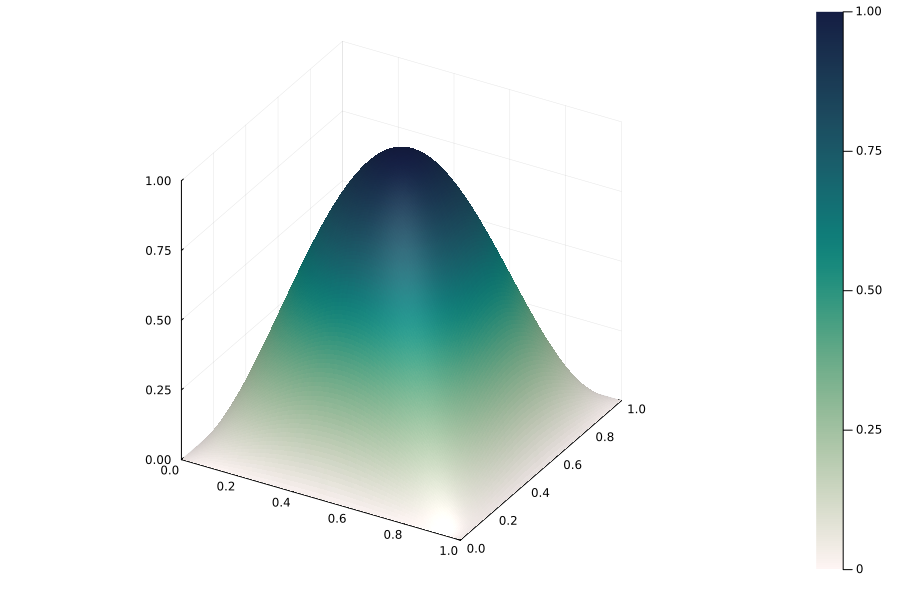

  3.709103 seconds (941.77 k allocations: 120.069 MiB, 1.75% gc time, 38.53% compilation time)


In [10]:
@time X,Y,Z=elliptic_pde_solver_opt(200,200,F,C,K,R,G;graph=true) ;

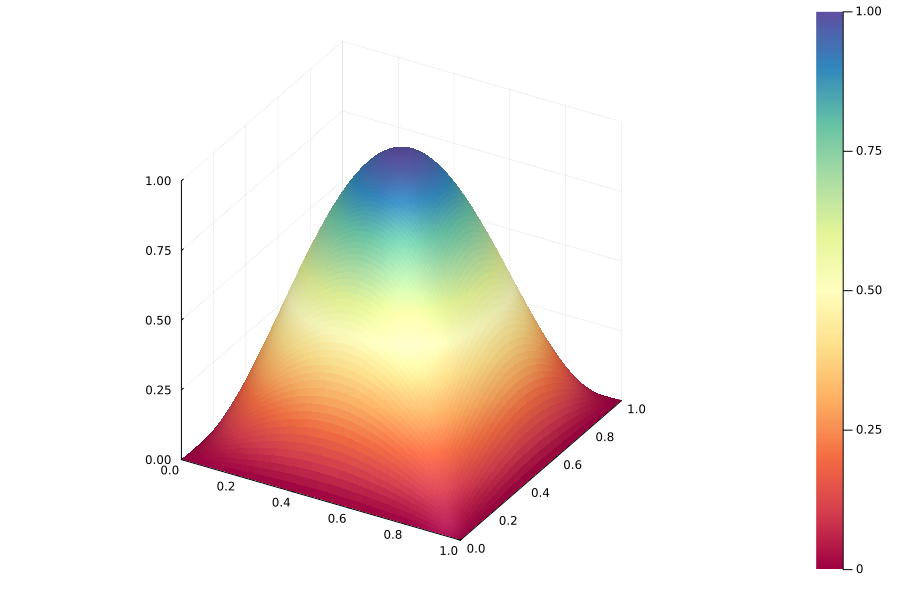

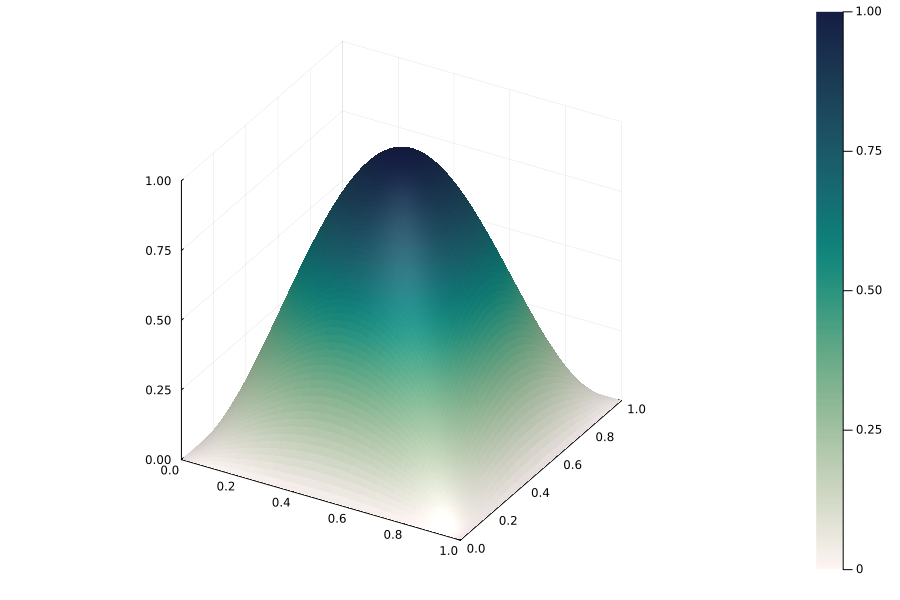

 20.487035 seconds (260.67 k allocations: 20.440 GiB, 4.01% gc time)


  1.837424 seconds (70.60 k allocations: 29.183 MiB, 0.10% gc time)


In [11]:
@time X,Y,Z=elliptic_pde_solver(120,120,F,C,K,R,G;graph=true) ;
@time X,Y,Z=elliptic_pde_solver_opt(120,120,F,C,K,R,G;graph=true) ;

In [12]:
# sample functions
a(x,y)=1
b(x,y)=0#+1
c(x,y)=1
d(x,y)=0#+1
e(x,y)=0#+1
f(x,y)=0#+sin(x+y)
g(x,y)=2*π^2*sin(π*x)*sin(π*y)# - π^2*cos(π*x)*cos(π*y) - π*cos(π*x)*sin(π*y)-π*sin(π*x)*cos(π*y)-sin(x+y)*sin(π*x)*sin(π*y)

F=a,b,c,d,e,f,g;

# sample boundary conditions : Robin, Dirichlet, Dirichlet, Robin
cx1,cx2,cy1,cy2=0,0,0,0
C=cx1,cx2,cy1,cy2
kx1(y),kx2(y),ky1(x),ky2(x)=1,1,1,1
K=kx1,kx2,ky1,ky2
αx,βx,αy,βy=0,5,0,5
R=αx,βx,αy,βy
gx1(y)=0
gx2(y),gy1(x)=0,0
gy2(x)=0
G=gx1,gx2,gy1,gy2 ;

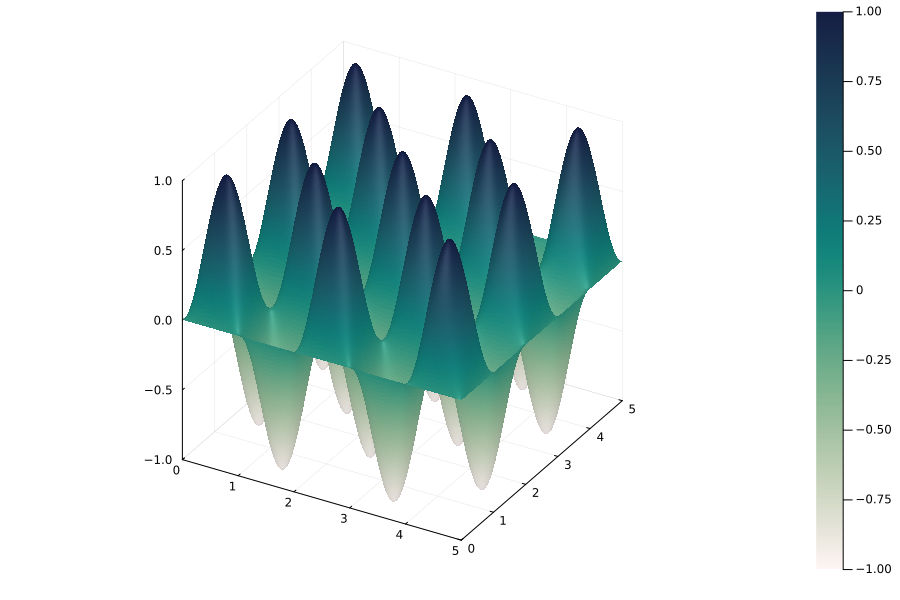

  6.359255 seconds (1.06 M allocations: 420.872 MiB, 0.36% gc time, 11.59% compilation time: 100% of which was recompilation)


In [13]:
@time X,Y,Z=elliptic_pde_solver_opt(500,500,F,C,K,R,G;graph=true) ;


In [14]:
#Atkinson question 6 pg  465. Solution is u(x,y)=e^x sin(πy)
# sample functions
a(x,y)=π^2
b(x,y)=0#+1
c(x,y)=1
d(x,y)=0#+1
e(x,y)=0#+1
f(x,y)=0#+sin(x+y)
g(x,y)=0

F=a,b,c,d,e,f,g;

# sample boundary conditions : Robin, Dirichlet, Dirichlet, Robin
cx1,cx2,cy1,cy2=0,0,0,0
C=cx1,cx2,cy1,cy2
kx1(y),kx2(y),ky1(x),ky2(x)=1,1,1,1
K=kx1,kx2,ky1,ky2
αx,βx,αy,βy=0,1,0,1
R=αx,βx,αy,βy
gx1(y)=sin(π*y)
gx2(y)=exp(1)*sin(π*y)
gy1(x)=0
gy2(x)=0
G=gx1,gx2,gy1,gy2 ;

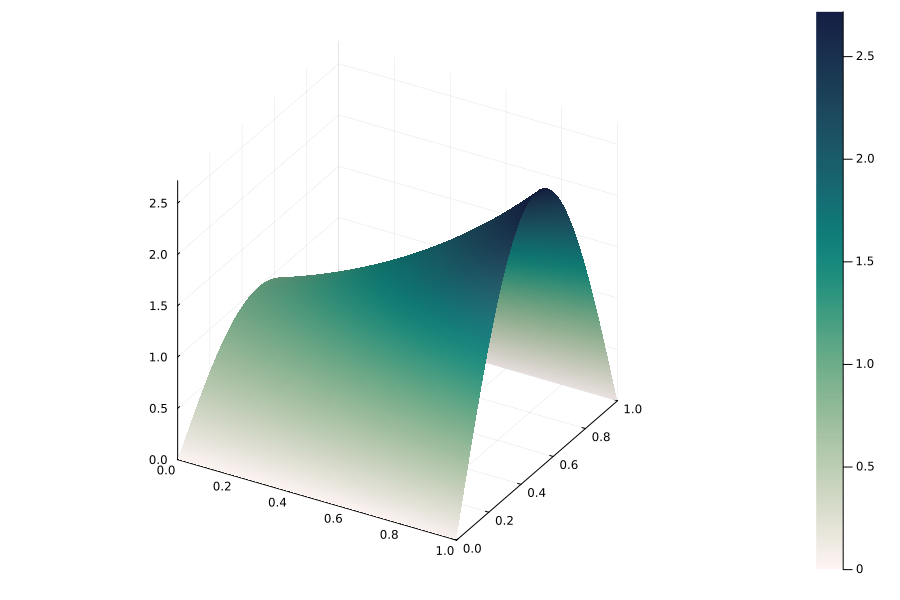

  5.117837 seconds (1.06 M allocations: 419.036 MiB, 0.94% gc time, 13.30% compilation time: 100% of which was recompilation)


In [15]:
@time X,Y,Z=elliptic_pde_solver_opt(500,500,F,C,K,R,G;graph=true) ;

In [16]:
#computing the exact solution
zz=zeros(501,501)
for i=1:501
    for j=1:501
        zz[i,j]=exp(X[j])*sin(π*Y[i])
    end
end

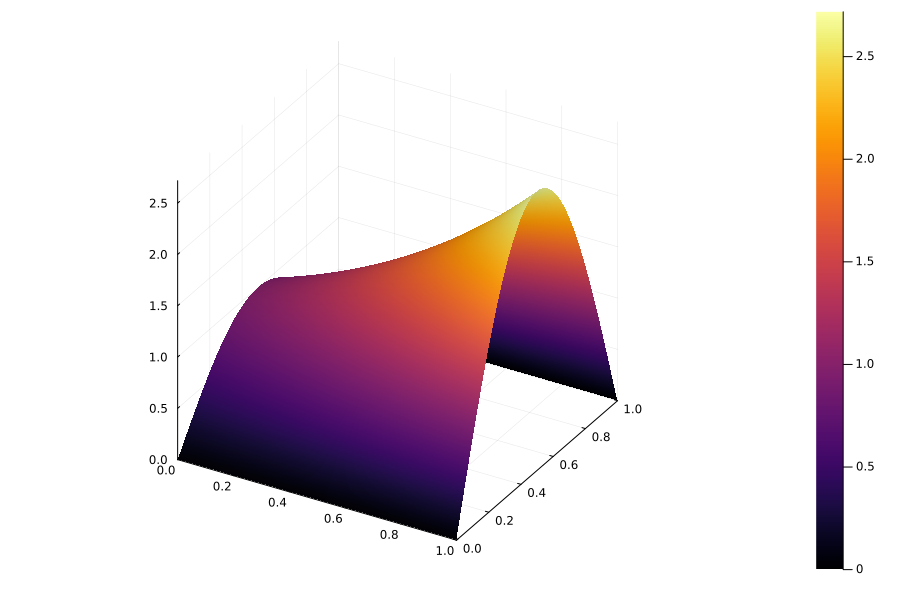

In [17]:
surface(X,Y,zz,size=(900,600))

In [18]:
# R.M.S. error
sqrt(sum((zz-Z)^2)/501/501)

7.2598288066033424e-6